# Workflow for building ML model on solar data

1. Load data
2. Explore dataset
3. Engineer new features
4. Remove less useful features
5. Setup cross validation
6. Test models and tune model parameters
7. Apply model to test data and submit

What are some other improvements I could make to this model and my fitting of the model?
- break the training set into trainging/testing split or use cross validation in the fitting
- try some other 'cumulation' method for reducing the feature size over simulation ensemble and forecasts
    - in particular, I think I could try summing over the forecast times, or integrating over a linear/spline interpolation of the forecast times and then performing an average or weighted average over simulation ensembles.
- I am currently not incorporating simulation or mesonet elevation into the model. I could do so in a crude way by weighting the different simulation ensembles by their simulated elevations. 
    - There are 2 different elevations for the ensembles---the control simulation is at one elevation and all the other ensembles are at a second elevation.
    - I should check to to see if the mesonet elevations all lie between the two sets of simulation elevations.
        - However, the simulation elevations are not at the same lat/lon of the mesonets, so I will first need to interpolate the simulation elevations onto the mesonet points. I can do this using the same interpolation scheme as for the other simulation data.
    - If the mesonet elevations do all lie between the two sets of interpolated simulation elevations, then I can weight the ensembles by their closeness to the mesonet elevation when averaging over the elevations.
- Perform a more rigorous feature reduction of the 15 properties with a given model. I could use PCA or similar to see which combinations of the parameters contributes the most to the variance.
- I could include previous time-step data as features in the model. This would only work for the simulation data, as I would need to be able to construct this feature for the testing data. 
    - The amount of time shift, number of time-shifted entries, and which properties to use in creating time-shifted entries are all variables I can play with here.

## 0. Load libraries and functions for the workflow

In [1]:
# Load libraries

%load_ext autoreload
% autoreload 2
%matplotlib inline

import pprint
import os

import netCDF4
import numpy as np 
import pandas as pd
import sklearn

import matplotlib.pyplot as plt
import seaborn as sns

import solar_energy


sns.set_style('ticks')

In [2]:
def todatetime(intdate):
    """Convert integer timestamp to datetime object."""
    strdate = str(intdate)
    year = int(strdate[0:4])
    month = int(strdate[4:6])
    day = int(strdate[6:8])
    return pd.datetime(year, month, day)

def netcdf4_to_dataframe(netcdf):
    """
    Convert entire netcdf object to dataframe. 
    
    Only works well for small netcdf objects.
    
    """
    data_as_array = np.array([np.array(i).flatten() for i in netcdf.variables.values()]).T
    data_as_dataframe = pd.DataFrame(data_as_array, columns=netcdf.variables.keys())
    return data_as_dataframe

def interpolate_simulation_data(x, y, filename, 
                                location='../data/train/', 
                                ensemble_aggregator=np.mean,
                                forecast_aggregator=np.mean,
                               ):
    """
    Interpolate simulation data at all the mesonet x, y coordinates.
    
    Parameters
    ----------
    x, y : numpy arrays
        1-D arrays of latitudes and longitudes respectively.
    filename : str
        Name of the file from which to load and interpolate data.
    location : str, optional
        Path to file. Defaults to '../data/train/'
    
    Returns
    -------
    averaged_data : numpy array
        
    
    """
    data_array = load_netcdf4_data(filename, location)
    interpolated_data = solar_energy.bilinear_interpolation(x, y, data_array)
    # Average over ensembles. This could be converted to an elevation-weighted average.
    averaged_data = ensemble_aggregator(interpolated_data, axis=1)
    # Average over forecast hours. This could be converted to a sum, or integral.
    averaged_data = forecast_aggregator(averaged_data, axis=1)
    return averaged_data

def load_netcdf4_data(filename, location='../data/train/'):
    """Load last entry in a netcdf4 file into a numpy array."""
    dataset = netCDF4.Dataset(location+filename, 'r')
    data_array = np.array(list(dataset.variables.values())[-1])
    return data_array

## 1. Load training and test data.

In [3]:
# load the simulation coords and elevations

elevation = netCDF4.Dataset('../data/gefs_elevations.nc', 'r')
elevation_pd = netcdf4_to_dataframe(elevation)
# shift simulation longitudes to same scale as mesonet longitudes
elevation_pd['longitude'] = elevation_pd['longitude'] - 360.

# load the mesonet coords
station_info = pd.read_csv('../data/station_info.csv')
mesonet_lats = np.array(station_info['nlat']) - elevation_pd['latitude'].min()
mesonet_lons = np.array(station_info['elon']) - elevation_pd['longitude'].min()

In [4]:
# load mesonet training data (response)

training_y = pd.read_csv('../data/train.csv')
training_y.set_index('Date', inplace=True)
training_y.index = training_y.index.map(todatetime)

# load simulation training data (features)

training_location = '../data/train/'
training_sim_filenames = os.listdir(training_location)
training_sim_names = ['_'.join(f.split('_')[0:2]) for f in training_sim_filenames]

training_sim_data = {n:interpolate_simulation_data(mesonet_lats, 
                                                   mesonet_lons, 
                                                   f, 
                                                   training_location, 
                                                   forecast_aggregator=np.sum,
                                                  ) for n, f in 
                     zip(training_sim_names, training_sim_filenames)}

training_sim_dfs = {k:pd.DataFrame(v, index=training_y.index, columns=training_y.columns) 
                    for k, v in training_sim_data.items()}

In [5]:
simulation_descriptions = {
    'apcp_sfc': '3-Hour accumulated precipitation at the surface (kg/m**2)',
    'dlwrf_sfc': 'Downward long-wave radiative flux average at the surface	W m-2',
    'dswrf_sfc': 'Downward short-wave radiative flux average at the surface (W/m**2)',
    'pres_msl': 'Air pressure at mean sea level (Pa)',
    'pwat_eatm': 'Precipitable Water over the entire depth of the atmosphere (kg/m**2)',
    'spfh_2m': 'Specific Humidity at 2 m above ground(kg/kg)',
    'tcdc_eatm': 'Total cloud cover over the entire depth of the atmosphere (%)',
    'tcolc_eatm': 'Total column-integrated condensate over the entire atmos. (kg/m**2)',
    'tmax_2m': 'Maximum Temperature over the past 3 hours at 2 m above the ground (K)',
    'tmin_2m': 'Mininmum Temperature over the past 3 hours at 2 m above the ground (K)',
    'tmp_2m': 'Current temperature at 2 m above the ground (K)',
    'tmp_sfc': 'Temperature of the surface (K)',
    'ulwrf_sfc': 'Upward long-wave radiation at the surface (W/m**2)',
    'ulwrf_tatm': 'Upward long-wave radiation at the top of the atmosphere (W/m**2)',
    'uswrf_sfc': 'Upward short-wave radiation at the surface (W/m**2)',
}

In [6]:
# load simulation testing data

testing_location = '../data/test/'
testing_sim_filenames = os.listdir(testing_location)
testing_sim_names = ['_'.join(f.split('_')[0:2]) for f in testing_sim_filenames]

testing_sim_data = {n:interpolate_simulation_data(mesonet_lats, mesonet_lons, f, testing_location) for n, f in 
                     zip(testing_sim_names, testing_sim_filenames)}

testing_sim_dfs = {k:pd.DataFrame(v, columns=training_y.columns) 
                    for k, v in testing_sim_data.items()}

In [7]:
sample_submission = pd.read_csv('../data/sampleSubmission.csv', index_col=0)

## 2. Explore Dataset

What are some things I would like to know about my training data?
3. What do each of the features correspond to physically?
1. How does each variable change over time? (Both features and response).
2. How do various features correlate with the response, both over time and at each time?
4. How do I imagine each of the features might relate to the response variable?

In [8]:
training_y.columns

Index(['ACME', 'ADAX', 'ALTU', 'APAC', 'ARNE', 'BEAV', 'BESS', 'BIXB', 'BLAC',
       'BOIS', 'BOWL', 'BREC', 'BRIS', 'BUFF', 'BURB', 'BURN', 'BUTL', 'BYAR',
       'CAMA', 'CENT', 'CHAN', 'CHER', 'CHEY', 'CHIC', 'CLAY', 'CLOU', 'COOK',
       'COPA', 'DURA', 'ELRE', 'ERIC', 'EUFA', 'FAIR', 'FORA', 'FREE', 'FTCB',
       'GOOD', 'GUTH', 'HASK', 'HINT', 'HOBA', 'HOLL', 'HOOK', 'HUGO', 'IDAB',
       'JAYX', 'KENT', 'KETC', 'LAHO', 'LANE', 'MADI', 'MANG', 'MARE', 'MAYR',
       'MCAL', 'MEDF', 'MEDI', 'MIAM', 'MINC', 'MTHE', 'NEWK', 'NINN', 'NOWA',
       'OILT', 'OKEM', 'OKMU', 'PAUL', 'PAWN', 'PERK', 'PRYO', 'PUTN', 'REDR',
       'RETR', 'RING', 'SALL', 'SEIL', 'SHAW', 'SKIA', 'SLAP', 'SPEN', 'STIG',
       'STIL', 'STUA', 'SULP', 'TAHL', 'TALI', 'TIPT', 'TISH', 'VINI', 'WASH',
       'WATO', 'WAUR', 'WEAT', 'WEST', 'WILB', 'WIST', 'WOOD', 'WYNO'],
      dtype='object')

In [9]:
len(training_y.columns)

98

In [10]:
training_y.index

DatetimeIndex(['1994-01-01', '1994-01-02', '1994-01-03', '1994-01-04',
               '1994-01-05', '1994-01-06', '1994-01-07', '1994-01-08',
               '1994-01-09', '1994-01-10',
               ...
               '2007-12-22', '2007-12-23', '2007-12-24', '2007-12-25',
               '2007-12-26', '2007-12-27', '2007-12-28', '2007-12-29',
               '2007-12-30', '2007-12-31'],
              dtype='datetime64[ns]', name='Date', length=5113, freq=None)

Text(0.5,0,'Year')

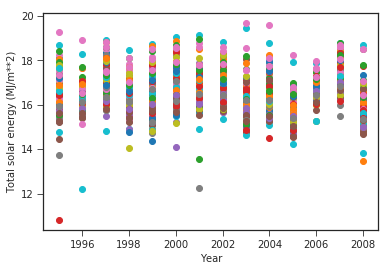

In [11]:
plt.plot(training_y.groupby(pd.Grouper(freq='Y')).mean()/1.e6, 'o');
plt.ylabel('Total solar energy (MJ/m**2)')
plt.xlabel('Year')

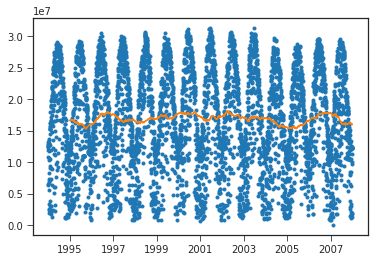

In [12]:
plt.plot(training_y['ACME'], '.')
plt.plot(training_y['ACME'].rolling(365).mean())

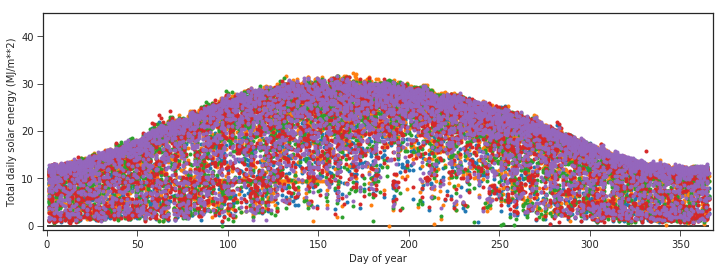

In [13]:
number_of_sensors = 5
sensors_to_sample = np.random.randint(0, 97, size=number_of_sensors)

fig, ax = plt.subplots(figsize=(12, 4))
ax.hlines(0, 0, 366)
for sensor in training_y.columns[sensors_to_sample]:
    ax.plot(training_y.index.dayofyear, training_y[sensor]/1.e6, '.')
ax.set_ylim(-1, 45);
ax.set_xlim(-2, 368);
ax.set_xlabel('Day of year');
ax.set_ylabel('Total daily solar energy (MJ/m**2)');

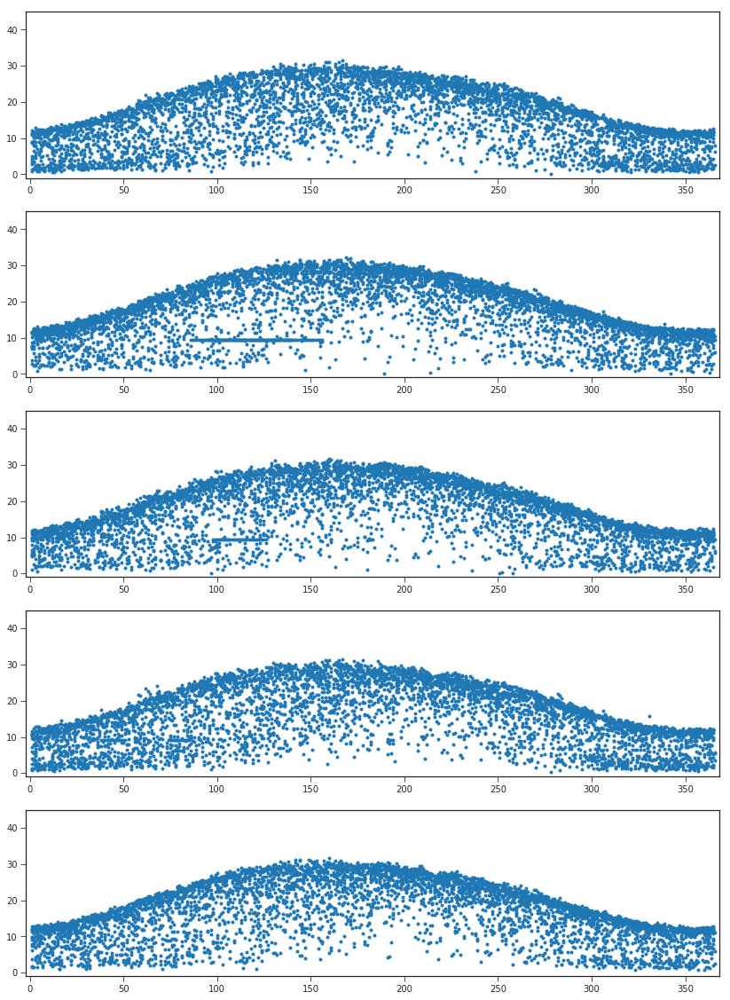

In [14]:
sensors_to_sample
fig, axes = plt.subplots(number_of_sensors, 1, figsize=(14, 4*number_of_sensors))
for sensor, ax in zip(training_y.columns[sensors_to_sample], axes.flatten()):
    ax.plot(training_y.index.dayofyear, training_y[sensor]/1.e6, '.')
    ax.set_ylim(-1, 45);
    ax.set_xlim(-2, 368);
#ax.set_xlabel('Day of year');
#ax.set_ylabel('Total daily solar energy (MJ/m**2)');

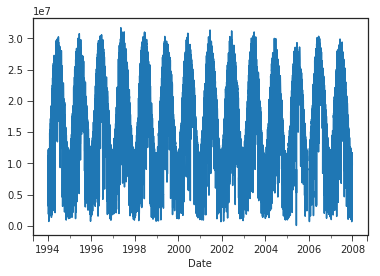

In [15]:
training_y['BIXB'].plot()

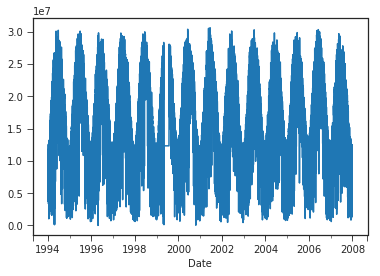

In [16]:
training_y[training_y.columns[24]].plot()

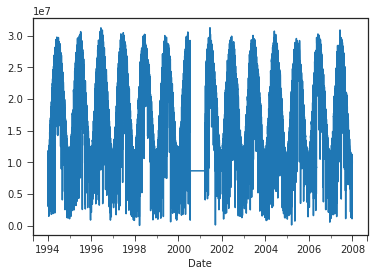

In [17]:
training_y[training_y.columns[32]].plot()

There appear to be some missing values in the sensor data. The 'missing' data seems to be taking the form of  stretches of time, signficant fractions of a year, where a sensor might have the same value. 

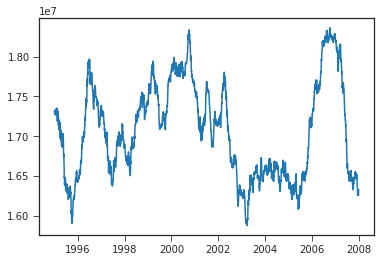

In [18]:
plt.plot(training_y[training_y.columns[sensors_to_sample[-1]]].rolling(365).mean())

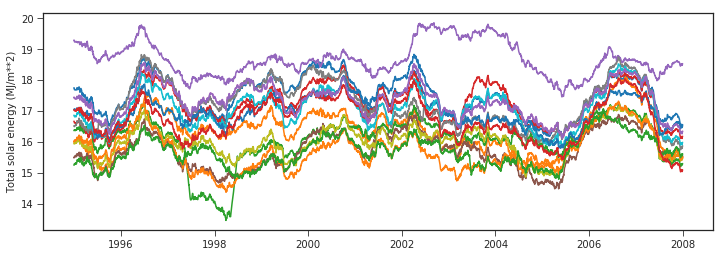

In [19]:
number_of_samples = 15
sensors_to_sample = np.random.randint(0, 97, size=number_of_samples)

fig, ax = plt.subplots(figsize=(12, 4))
for sensor in training_y.columns[sensors_to_sample]:
    ax.plot(training_y[sensor].rolling(365).mean()/1.e6)
ax.set_ylabel('Total solar energy (MJ/m**2)');

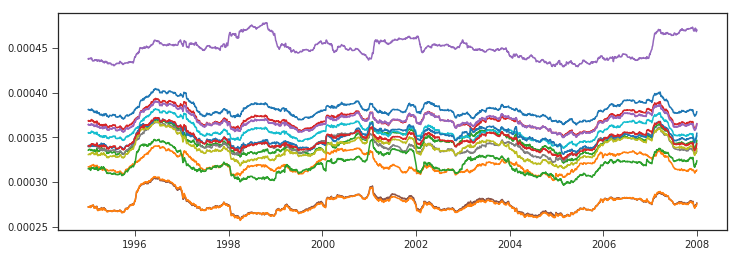

In [20]:
fig, ax = plt.subplots(figsize=(12, 4))
sim_data = training_sim_dfs['uswrf_sfc']
for sensor in sim_data.columns[sensors_to_sample]:
    ax.plot(sim_data[sensor].rolling(365).mean()/1.e6)
#ax.set_ylabel('Total solar energy (MJ/m**2)');

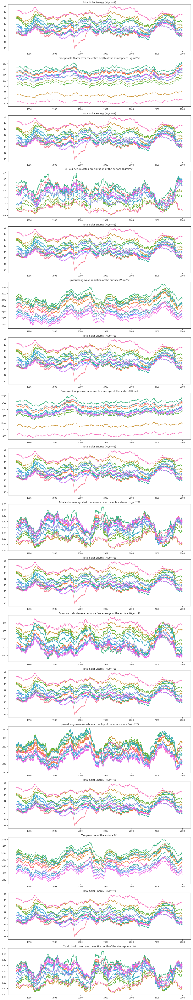

In [21]:
number_of_samples = 15
sensors_to_sample = np.random.randint(0, 97, size=number_of_samples)

colors = sns.color_palette('husl', number_of_samples)

simulation_properties = [
    #'tmp_2m', 
    #'spfh_2m', 
    #'tmax_2m', 
    #'tmin_2m', 
    'pwat_eatm', 
    'apcp_sfc', 
    'ulwrf_sfc', 
    #'uswrf_sfc', 
    'dlwrf_sfc', 
    #'pres_msl', 
    'tcolc_eatm', 
    'dswrf_sfc', 
    'ulwrf_tatm', 
    'tmp_sfc', 
    'tcdc_eatm',
]
num_plots = len(simulation_properties)
fig, axes = plt.subplots(num_plots*2, figsize=(14, 8*num_plots))

for k, ax in zip(simulation_properties, axes.reshape((num_plots, 2))):
    for sensor, c in zip(training_sim_dfs[k].columns[sensors_to_sample], colors):
        ax[0].plot(training_y[sensor].rolling(365).mean()/1.e6, color=c)
        ax[0].set_title('Total Solar Energy (MJ/m**2)')
        ax[1].plot(training_sim_dfs[k][sensor].rolling(365).mean(), color=c)
        ax[1].set_title(simulation_descriptions[k])
plt.tight_layout()

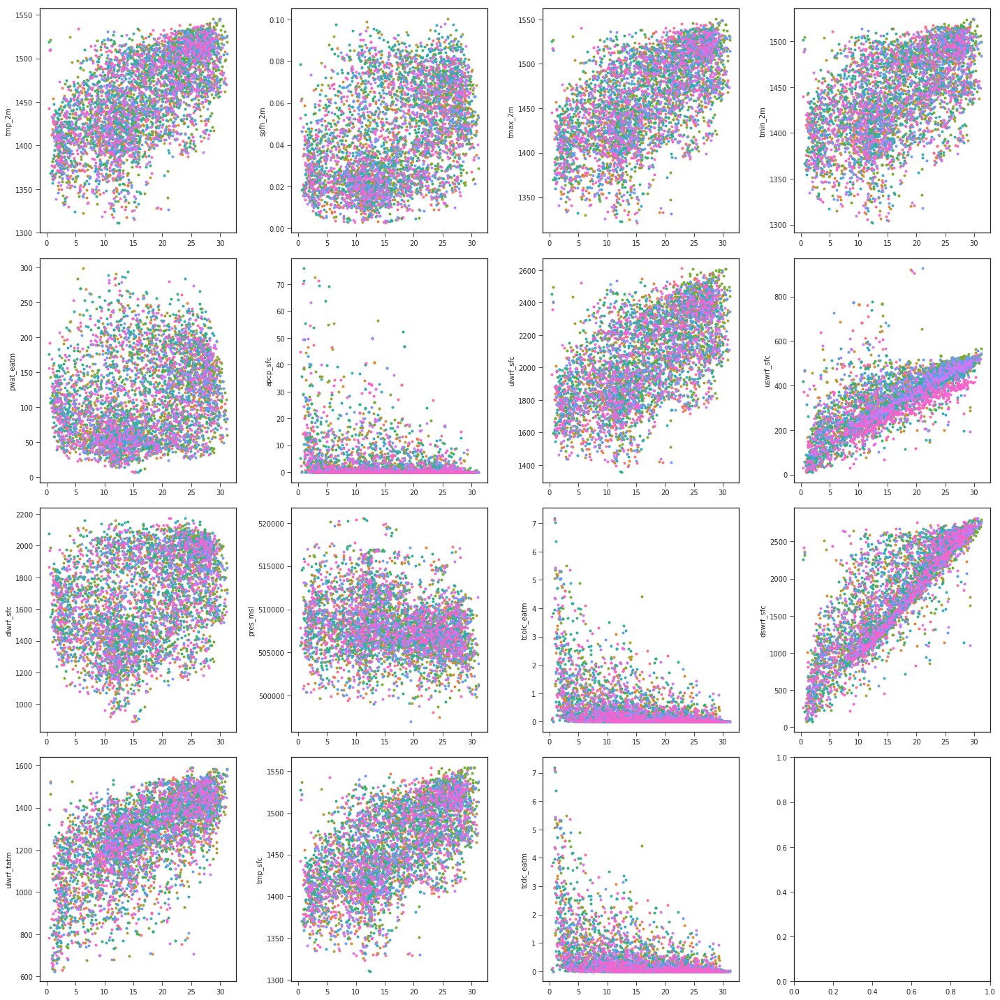

In [22]:
number_of_sensors = 10
sensors_to_sample = np.random.randint(0, 97, size=number_of_sensors)
colors = sns.color_palette('husl', number_of_sensors)

number_of_times = 500
times_to_sample = np.random.randint(0, len(training_y['ACME']), size=number_of_times)

fig, axes = plt.subplots(4, 4, figsize=(20, 20))
for (k, v), ax in zip(training_sim_dfs.items(), axes.flatten()):
    sensor_iterator = zip(v.columns[sensors_to_sample], 
                          colors,
                         )
    for sensor_name, color in sensor_iterator:
        ax.plot(training_y[sensor_name][times_to_sample]/1.e6, 
                v[sensor_name][times_to_sample], 
                '.',
                color=color,
               )
    ax.set_ylabel(k)
    #ax.set_title(simulation_descriptions[k])
plt.tight_layout()

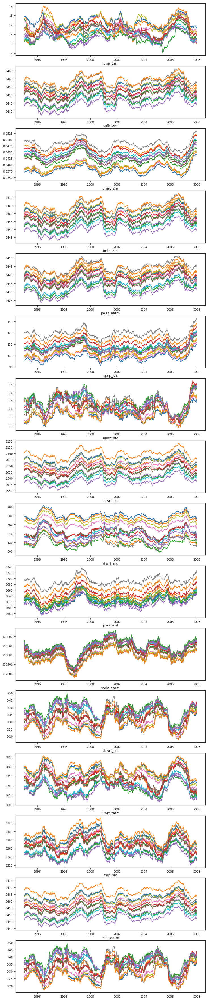

In [23]:
number_of_samples = 15
sensors_to_sample = np.random.randint(0, 97, size=number_of_samples)

num_plots = len(training_sim_dfs.keys())+1
fig, axes = plt.subplots(num_plots, 1, figsize=(12, 4*num_plots))

for sensor in training_y.columns[sensors_to_sample]:
    axes[0].plot(training_y[sensor].rolling(365).mean()/1.e6)

for (k, v), ax in zip(training_sim_dfs.items(), axes[1:].flatten()):
    for sensor in v.columns[sensors_to_sample]:
        ax.plot(v[sensor].rolling(365).mean())
        ax.set_title(k)


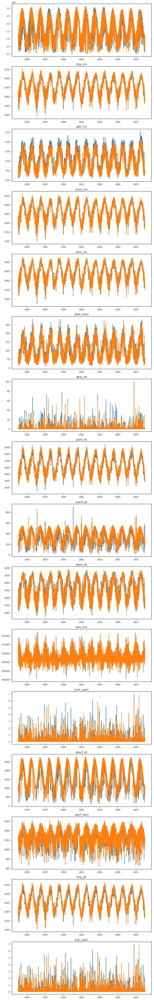

In [24]:
indices = [0, 2]
num_sims = len(training_sim_data)+1
fig, axes = plt.subplots(num_sims, 1, figsize=(10, 4*num_sims))
axes[0].plot(training_y.index, training_y[training_y.columns[indices]])
for (k, v), ax in zip(training_sim_data.items(), axes[1:].flatten()):
    ax.plot(training_y.index, v[:, indices])
    ax.set_title(k)
plt.tight_layout()

Looking at the correlations between the training data and the simulation data, there appear to be farily high correlations between the total sunlight incident on the solar arrays over the course of a day and the upward and downward shortwave radiative flux at the surface of the earth, averaged over models and forecast times.

## 3. Data Cleaning

I want to remove rows, for specific sensors, where consecutive values are identical. One thing to think about is, can I limit this removal to > n consecutive entries before I remove rows? Ignoring this question for a moment, I can remove these rows by first creating a hierarchical dataframe that groups by time and sensor name. Then I can add each simulated property for each sensor and timestamp.

In [25]:
# combine simulations and mesonet data into one multilevel dataframe
list(training_sim_dfs.values())[0].columns.name = 'Name'
training_df = pd.concat([v.T.stack() for v in training_sim_dfs.values()], axis=1)
training_df = pd.concat([training_df, training_y.T.stack()], axis=1)
names = list(training_sim_dfs.keys())
names.append('mesonets')
training_df.columns = names

cleaned_training_df = training_df.loc[training_df['mesonets'].diff() != 0,]

In [26]:
# combine simulations on testing set in the same way we did for the training set

testing_df = pd.concat([v.T.stack() for v in testing_sim_dfs.values()], axis=1)
names = list(testing_sim_dfs.keys())
testing_df.columns = names

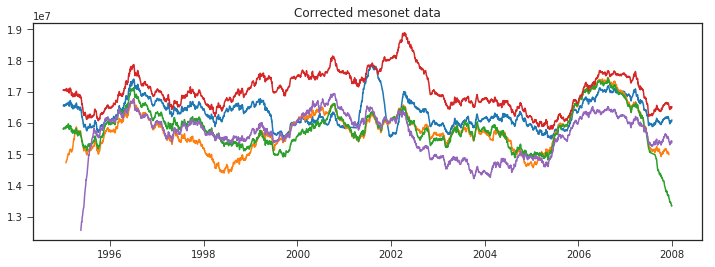

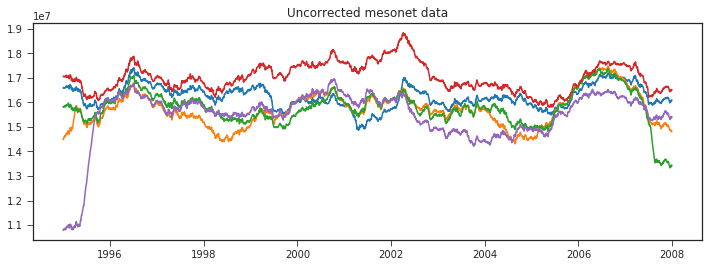

In [27]:
net_names = cleaned_training_df.index.levels[0]

number_of_sensors = 5
sensors_to_sample = np.random.randint(0, len(net_names), size=number_of_sensors)

fig, ax = plt.subplots(figsize=(12, 4))
#sim_data = training_sim_dfs['uswrf_sfc']
for sensor in net_names[sensors_to_sample]:
    ax.plot(cleaned_training_df.loc[sensor, 'mesonets'].rolling(365, min_periods=365).mean())
    #ax.plot(sim_data[sensor].rolling(365).mean()/1.e6)
plt.title('Corrected mesonet data');
    
fig, ax = plt.subplots(figsize=(12, 4))
sim_data = training_y
for sensor in sim_data.columns[sensors_to_sample]:
    ax.plot(sim_data[sensor].rolling(365, min_periods=365).mean())
plt.title('Uncorrected mesonet data');

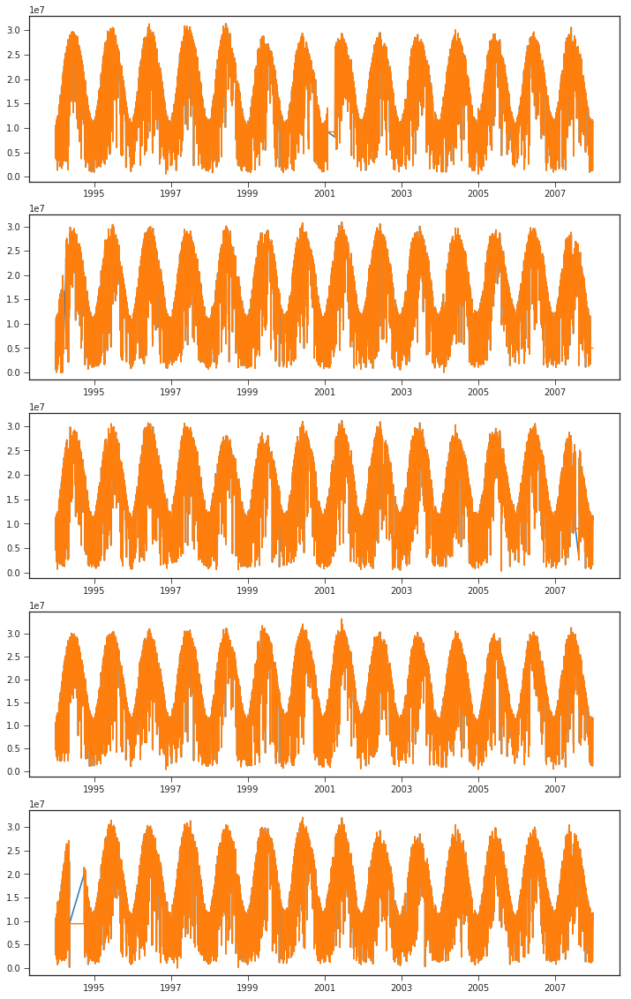

In [28]:
fig, axes = plt.subplots(number_of_sensors, 1, figsize=(12, 4*number_of_sensors))
sim_data = training_y
for sensor, ax in zip(sim_data.columns[sensors_to_sample], axes.flatten()):
    ax.plot(cleaned_training_df.loc[sensor, 'mesonets'])
    ax.plot(sim_data[sensor])

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:1020: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


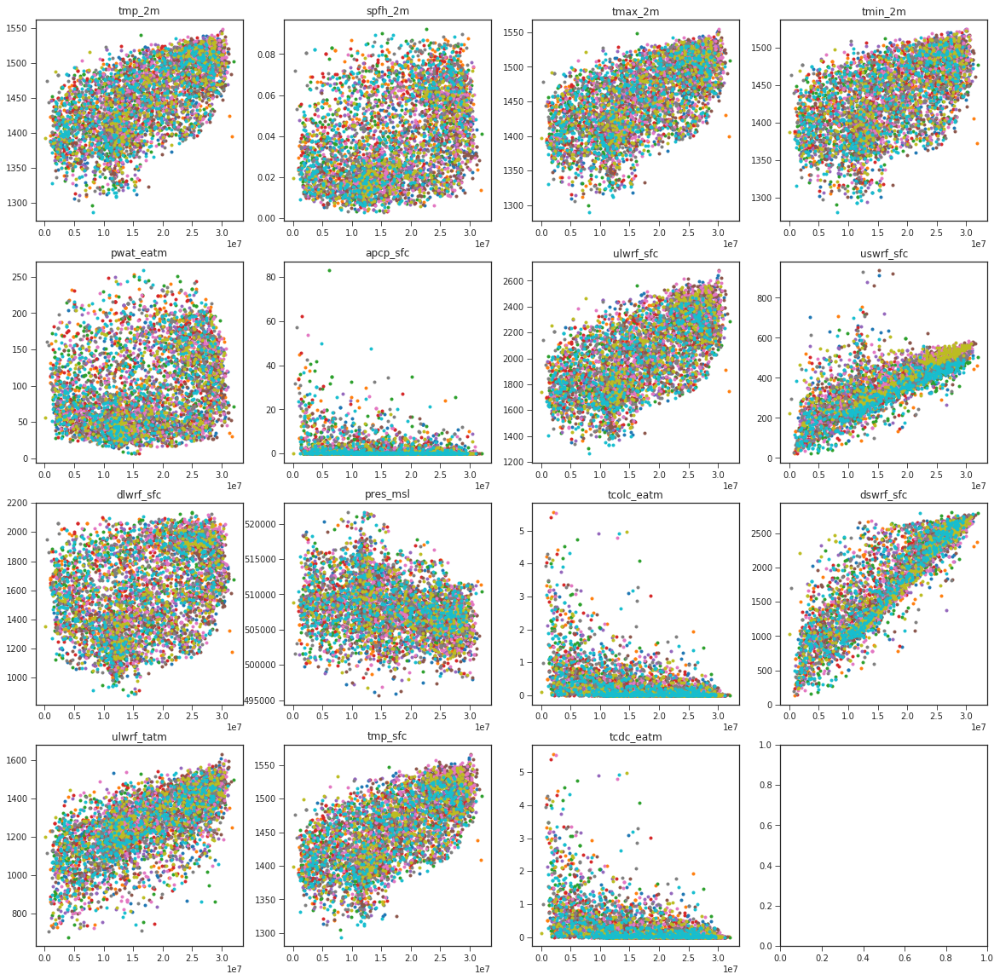

In [29]:
# plot each simulated time series against the response timeseries to visually inspect for correlations.

net_names = cleaned_training_df.index.levels[0]

number_of_sensors = 10
sensors_to_sample = np.random.choice(cleaned_training_df.index.levels[0], size=number_of_sensors)
colors = sns.color_palette('husl', number_of_sensors)

number_of_times = 500
times_to_sample = np.random.choice(cleaned_training_df.index.levels[1], size=number_of_times)

fig, axes = plt.subplots(4, 4, figsize=(20, 20))
for sensor in sensors_to_sample:
    data = cleaned_training_df.loc[sensor]
    for simulation, ax in zip(data.columns[0:-1], axes.flatten()):
        ax.plot(data.loc[times_to_sample, 'mesonets'], data.loc[times_to_sample, simulation], '.')
        ax.set_title(simulation)

## Initial ML model

Ok, now I need to concatenate all my data so that I have a (5113, 98) array for the training data and a (5113, 98*2) array for the training input data, starting with just inputs 7 and 11 (upward and downward shortwave flux at surface).

I think I can drop the timestamps, as they don't really provide any predictive benefit. There could be some benefit to including the day of the year, perhaps, as a large part of the signal is cyclical. However, there is a little issue with leap years. Also, they training x data should already include the cyclical signal.

In [32]:
training_y = training_df.loc['ACME', 'mesonets']
training_x = training_df.loc['ACME', list(set(training_df.columns)-{'mesonets'})]
testing_x = testing_df.loc['ACME']

In [ ]:
training_y = np.array(training_df['mesonets'])

features = ['uswrf_sfc', 'dswrf_sfc']
training_x = np.array(training_df[features])

testing_x = np.array(testing_df[features])

In [ ]:
print(np.shape(training_y))
print(np.shape(training_x))
print(np.shape(testing_x))

In [ ]:
training_y = np.array(training_y)
training_x = np.hstack((training_sim_data['uswrf_sfc'], training_sim_data['dswrf_sfc']))
testing_x = np.hstack((testing_sim_data['uswrf_sfc'], testing_sim_data['dswrf_sfc']))

What are some techniques I could apply to this data? I am basically removing the time-dependence of the data and trying to model the correlations between the simulation data and real data.
- Linear regression
    - least squares
    - ridge regression
    - gaussian process
    - decision trees
    - neural network
- Non-linear regression
    - To do this, I think I will need to create the non-linear terms and add them to X, then a linear regression will include these higher-order terms.

In [47]:
from sklearn import linear_model
from sklearn.metrics import mean_absolute_error, explained_variance_score, make_scorer
from sklearn.model_selection import TimeSeriesSplit, cross_val_score

### Ordinary least squares with only 2 input datasets

In [ ]:
cv = TimeSeriesSplit(n_splits=10)
ols = linear_model.LinearRegression()
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
scores = cross_val_score(ols, training_x, training_y, cv=cv, scoring=mae_scorer)
print("average mae = %0.2f (+/- %0.2f)" % (scores.mean()*-1, scores.std()*2))

In [ ]:
scores

In [ ]:
ols = linear_model.LinearRegression()
ols.fit(training_x, training_y)
print('ols score:',ols.score(training_x, training_y))
predicted_y = ols.predict(training_x)
print('mean absolute error:', mean_absolute_error(training_y, predicted_y))
print('explained variance score:', explained_variance_score(training_y, predicted_y))
test_predicted_y = ols.predict(testing_x)

In [ ]:
test_predicted_y = ols.predict(testing_x)
test_predictions_df = pd.DataFrame(test_predicted_y.reshape(1796, 98), 
                                   index=sample_submission.index, 
                                   columns=sample_submission.columns
                                  )
test_predictions_df.to_csv('../results/ols_2_shortwave.csv')

### OLS with all input datasets

In [ ]:
training_x = np.hstack((v for v in training_sim_data.values()))
testing_x = np.hstack((v for v in testing_sim_data.values()))

In [ ]:
model = linear_model.LinearRegression()

In [ ]:
model.fit(training_x, training_y)
print('ols score:',model.score(training_x, training_y))
predicted_y = model.predict(training_x)
print('mean absolute error:', mean_absolute_error(training_y, predicted_y))
print('explained variance score:', explained_variance_score(training_y, predicted_y)) 

In [ ]:
test_predicted_y = model.predict(testing_x)
test_predictions_df = pd.DataFrame(test_predicted_y, 
                                   index=sample_submission.index, 
                                   columns=sample_submission.columns
                                  )
test_predictions_df.to_csv('../results/ols_all_data.csv')

### Ridge regression with only 2 datasets

In [ ]:
training_x = np.hstack((training_sim_data['uswrf_sfc'], training_sim_data['dswrf_sfc']))
testing_x = np.hstack((testing_sim_data['uswrf_sfc'], testing_sim_data['dswrf_sfc']))

In [ ]:
from sklearn.linear_model import Ridge, RidgeCV

In [ ]:
model = RidgeCV(alphas=(1.e-5, 1.e-3, 1.e-2, 1.e-1, 1.e0, 1.e2, 1.e3, 1.e5), store_cv_values=True)

In [ ]:
model.fit(training_x, training_y)
print('model score:',model.score(training_x, training_y))
predicted_y = model.predict(training_x)
print('mean absolute error:', mean_absolute_error(training_y, predicted_y))
print('explained variance score:', explained_variance_score(training_y, predicted_y)) 

In [ ]:
test_predicted_y = model.predict(testing_x)
test_predictions_df = pd.DataFrame(test_predicted_y, 
                                   index=sample_submission.index, 
                                   columns=sample_submission.columns
                                  )
test_predictions_df.to_csv('../results/ridge_shortwave.csv')

### Ridge regression with all datasets

In [ ]:
training_x = np.hstack((v for v in training_sim_data.values()))
testing_x = np.hstack((v for v in testing_sim_data.values()))

In [ ]:
model = Ridge(alpha=1.e3)

In [ ]:
model.fit(training_x, training_y)
print('model score:',model.score(training_x, training_y))
predicted_y = model.predict(training_x)
print('mean absolute error:', mean_absolute_error(training_y, predicted_y))
print('explained variance score:', explained_variance_score(training_y, predicted_y)) 

In [ ]:
model = RidgeCV(alphas=(1.e-5, 1.e-3, 1.e-2, 1.e-1, 1.e0, 1.e2, 1.e3, 1.e5), store_cv_values=True)

In [ ]:
model.fit(training_x, training_y)
print('model score:',model.score(training_x, training_y))
predicted_y = model.predict(training_x)
print('mean absolute error:', mean_absolute_error(training_y, predicted_y))
print('explained variance score:', explained_variance_score(training_y, predicted_y)) 

In [ ]:
test_predicted_y = model.predict(testing_x)
test_predictions_df = pd.DataFrame(test_predicted_y, 
                                   index=sample_submission.index, 
                                   columns=sample_submission.columns
                                  )
test_predictions_df.to_csv('../results/ridge_all_data.csv')

### Lasso Regression with 2 datasets

In [ ]:
from sklearn.linear_model import Lasso, LassoCV, LassoLarsCV, LassoLarsIC

In [ ]:
from sklearn.linear_model import MultiTaskLasso, MultiTaskLassoCV

In [ ]:
training_x = np.hstack((training_sim_data['uswrf_sfc'], training_sim_data['dswrf_sfc']))
testing_x = np.hstack((testing_sim_data['uswrf_sfc'], testing_sim_data['dswrf_sfc']))

In [ ]:
#model = MultiTaskLasso(alpha=1.)

In [ ]:
#model.fit(training_x, training_y)
#print('model score:',model.score(training_x, training_y))
#predicted_y = model.predict(training_x)
#print('mean absolute error:', mean_absolute_error(training_y, predicted_y))
#print('explained variance score:', explained_variance_score(training_y, predicted_y)) 

### Random Forest Regression with 2 datasets

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
RandomForestRegressor?

In [ ]:
training_x = np.hstack((training_sim_data['uswrf_sfc'], training_sim_data['dswrf_sfc']))
testing_x = np.hstack((testing_sim_data['uswrf_sfc'], testing_sim_data['dswrf_sfc']))

In [ ]:
model = RandomForestRegressor(n_estimators=50)

In [ ]:
model.fit(training_x, training_y)
print('model score:',model.score(training_x, training_y))
predicted_y = model.predict(training_x)
print('mean absolute error:', mean_absolute_error(training_y, predicted_y))
print('explained variance score:', explained_variance_score(training_y, predicted_y)) 

In [ ]:
test_predicted_y = model.predict(testing_x)
test_predictions_df = pd.DataFrame(test_predicted_y, 
                                   index=sample_submission.index, 
                                   columns=sample_submission.columns
                                  )
test_predictions_df.to_csv('../results/randomforest_shortwave_50_estimators.csv')

### Random Forest with all datasets

In [ ]:
training_x = np.hstack((v for v in training_sim_data.values()))
testing_x = np.hstack((v for v in testing_sim_data.values()))

In [ ]:
model = RandomForestRegressor(n_estimators=50)

In [ ]:
model.fit(training_x, training_y)
print('model score:',model.score(training_x, training_y))
predicted_y = model.predict(training_x)
print('mean absolute error:', mean_absolute_error(training_y, predicted_y))
print('explained variance score:', explained_variance_score(training_y, predicted_y)) 

In [ ]:
test_predicted_y = model.predict(testing_x)
test_predictions_df = pd.DataFrame(test_predicted_y, 
                                   index=sample_submission.index, 
                                   columns=sample_submission.columns
                                  )
test_predictions_df.to_csv('../results/randomforest_all_data_estimators.csv')

### Gradient Boosting Regression

In [48]:
from sklearn.ensemble import GradientBoostingRegressor

In [50]:
model = GradientBoostingRegressor(loss='ls', 
                                  learning_rate=0.2, n_estimators=100, max_depth=5, min_samples_leaf=5,
                                  criterion='mae',
                                 )

In [ ]:
list(set(training_df.columns) - {'mesonets'})

In [ ]:
training_y = np.array(training_df['mesonets'])

features = list(set(training_df.columns) - {'mesonets'})
training_x = np.array(training_df[features])

testing_x = np.array(testing_df[features])

In [49]:
training_y = training_df.loc['ACME', 'mesonets']
training_x = training_df.loc['ACME', list(set(training_df.columns)-{'mesonets'})]
testing_x = testing_df.loc['ACME']

In [ ]:
cv = TimeSeriesSplit(n_splits=10)
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

model = GradientBoostingRegressor(loss='ls', 
                              learning_rate=0.1, n_estimators=10, max_depth=3,
                              criterion='mae',
                             )

scores = cross_val_score(model, training_x, training_y, cv=cv, scoring=mae_scorer)
print("average mae = %0.2f (+/- %0.2f)" % (scores.mean()*-1, scores.std()*2))

In [ ]:
print('test %s')

In [52]:
cv = TimeSeriesSplit(n_splits=10)
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

num_estimators = [10, 50, 100, 150, 200]
for estimator in num_estimators:
    model = GradientBoostingRegressor(loss='ls', 
                                  learning_rate=0.1, n_estimators=estimator, max_depth=3, min_samples_leaf=5,
                                  criterion='mae',
                                 )
    scores = cross_val_score(model, training_x, training_y, cv=cv, scoring=mae_scorer)
    print("num_estimators: %s, average mae = %0.2f (+/- %0.2f)" % (estimator, scores.mean()*-1, scores.std()*2))

num_estimators: 10, average mae = 3380859.47 (+/- 545108.26)
num_estimators: 50, average mae = 2223076.84 (+/- 484416.74)
num_estimators: 100, average mae = 2214677.60 (+/- 475732.12)
num_estimators: 150, average mae = 2223079.11 (+/- 469391.32)
num_estimators: 200, average mae = 2231928.53 (+/- 458752.91)


150--200 estimators seem to give the best combination of low avg mae and low std mae.

In [53]:
cv = TimeSeriesSplit(n_splits=10)
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

depths = [3, 4, 5]
for depth in depths:
    model = GradientBoostingRegressor(loss='ls', 
                                  learning_rate=0.1, n_estimators=150, max_depth=depth, min_samples_leaf=5,
                                  criterion='mae',
                                 )
    scores = cross_val_score(model, training_x, training_y, cv=cv, scoring=mae_scorer)
    print("num_estimators: %s, average mae = %0.2f (+/- %0.2f)" % (estimator, scores.mean()*-1, scores.std()*2))

num_estimators: 200, average mae = 2212705.73 (+/- 468712.59)
num_estimators: 200, average mae = 2241823.64 (+/- 500630.09)
num_estimators: 200, average mae = 2254795.49 (+/- 538382.43)


Increasing the depth of trees seems to increase the std of mae and to a lesser extend the avg mae.

In [54]:
cv = TimeSeriesSplit(n_splits=10)
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

learning_rates = [0.2, 0.5]
for rate in learning_rates:
    model = GradientBoostingRegressor(loss='ls', 
                                  learning_rate=rate, n_estimators=150, max_depth=3, min_samples_leaf=5,
                                  criterion='mae',
                                 )
    scores = cross_val_score(model, training_x, training_y, cv=cv, scoring=mae_scorer)
    print("num_estimators: %s, average mae = %0.2f (+/- %0.2f)" % (rate, scores.mean()*-1, scores.std()*2))

num_estimators: 0.2, average mae = 2267867.08 (+/- 469755.45)
num_estimators: 0.5, average mae = 2443269.14 (+/- 581769.70)


Increasing the learing rate increases the avg and std mae.

In [55]:
cv = TimeSeriesSplit(n_splits=10)
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)

min_samples = [1, 2, 10, 20, 50]
for sample in min_samples:
    model = GradientBoostingRegressor(loss='ls', 
                                  learning_rate=0.1, n_estimators=150, max_depth=3, min_samples_leaf=sample,
                                  criterion='mae',
                                 )
    scores = cross_val_score(model, training_x, training_y, cv=cv, scoring=mae_scorer)
    print("samples: %s, average mae = %0.2f (+/- %0.2f)" % (sample, scores.mean()*-1, scores.std()*2))

samples: 1, average mae = 2244658.75 (+/- 516672.50)
samples: 2, average mae = 2246333.53 (+/- 521035.41)
samples: 10, average mae = 2214019.46 (+/- 460376.83)
samples: 20, average mae = 2217948.32 (+/- 460206.28)
samples: 50, average mae = 2206994.62 (+/- 498706.73)


I'm finding a minimum in std mae around 10--20 samples/leaf node, with not too much change in the avg mae.

In [51]:
model.fit(training_x, training_y)
print('model score:',model.score(training_x, training_y))
predicted_y = model.predict(training_x)
print('mean absolute error:', mean_absolute_error(training_y, predicted_y))
print('explained variance score:', explained_variance_score(training_y, predicted_y)) 

model score: 0.8979006686749018
mean absolute error: 1460214.6940768864
explained variance score: 0.8996784709375021


In [ ]:
test_predicted_y = model.predict(testing_x)
test_predictions_df = pd.DataFrame(test_predicted_y.reshape(1796, 98), 
                                   index=sample_submission.index, 
                                   columns=sample_submission.columns
                                  )
test_predictions_df.to_csv('../results/gradient_boosting_shortwave_100_estimators.csv')